In [2]:
import numpy as np
import pandas as pd 
import os
import cv2
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.io import imread
from PIL import Image as pil_image
from sklearn.model_selection import train_test_split
from scipy.ndimage import median_filter
from skimage import exposure
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,recall_score,f1_score
import itertools

In [3]:
from tensorflow.keras import  layers, models
from tensorflow.keras.applications import EfficientNetB0
from keras.layers import Dense, Dropout
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.layers import Input,GlobalAveragePooling2D
from keras.models import Model,Sequential
from keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau
from keras.optimizers import Adam, RMSprop
from keras.applications.inception_v3 import InceptionV3

In [4]:
data_dir = Path('/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets')
data_dir


PosixPath('/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets')

In [5]:
lung_aca_dir = data_dir /'lung_aca'
lung_n_dir = data_dir /'lung_n'
lung_scc_dir = data_dir /'lung_scc'

adenocarcinoma_lung = lung_aca_dir.glob('*.jpeg')
benign_lung = lung_n_dir.glob('*.jpeg')
carcinoma_lung = lung_scc_dir.glob('*.jpeg')


In [6]:
train_data = []
for img in adenocarcinoma_lung:
  train_data.append((img, 0))
for img in benign_lung:
  train_data.append((img,1))
for img in carcinoma_lung:
  train_data.append((img,2))
train_data = pd.DataFrame(train_data, columns=['image', 'label'],index=None)

train_data = train_data.sample(frac=1.).reset_index(drop=True)

In [7]:
train_data.head()

,image,label
0,/kaggle/input/lung-and-colon-cancer-histopatho...,0
1,/kaggle/input/lung-and-colon-cancer-histopatho...,0
2,/kaggle/input/lung-and-colon-cancer-histopatho...,2
3,/kaggle/input/lung-and-colon-cancer-histopatho...,1
4,/kaggle/input/lung-and-colon-cancer-histopatho...,2


In [8]:
train_data.shape

(15000, 2)

0    5000
2    5000
1    5000
Name: label, dtype: int64


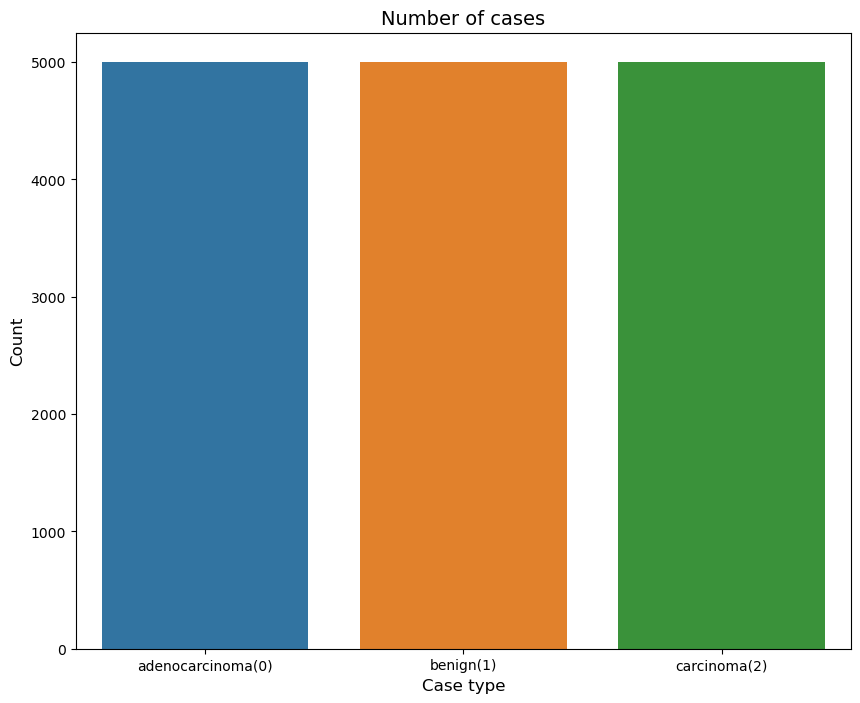

In [9]:
cases_count = train_data['label'].value_counts()
print(cases_count)

plt.figure(figsize=(10,8))
sns.barplot(x=cases_count.index, y= cases_count.values)
plt.title('Number of cases', fontsize=14)
plt.xlabel('Case type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(range(len(cases_count.index)), ['adenocarcinoma(0)','benign(1)', 'carcinoma(2)'])
plt.show()

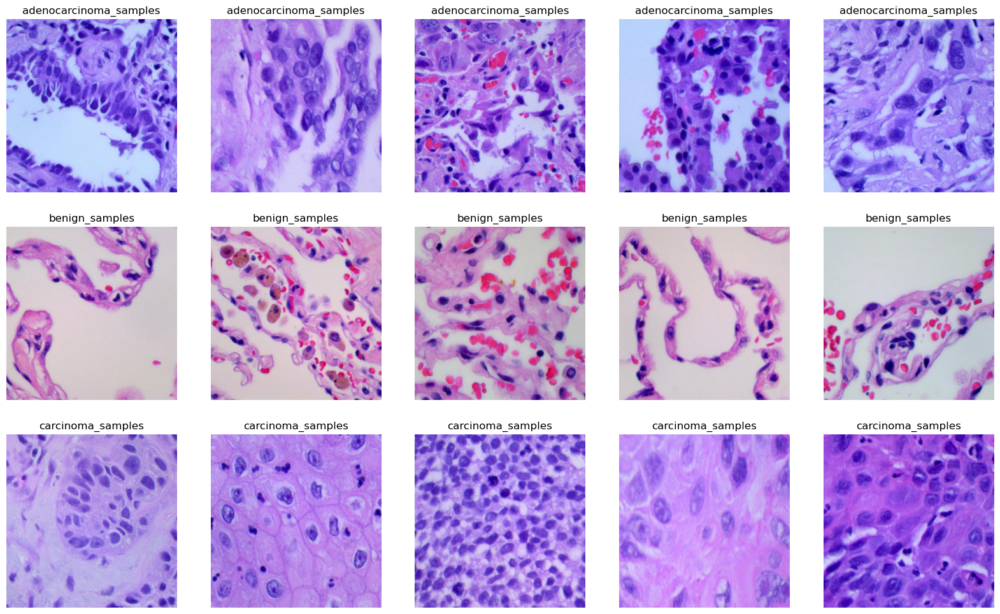

In [9]:
adenocarcinoma_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()
benign_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
carcinoma_samples = (train_data[train_data['label']==2]['image'].iloc[:5]).tolist()


samples = adenocarcinoma_samples + benign_samples+carcinoma_samples
del adenocarcinoma_samples, benign_samples,carcinoma_samples

# Plot the data 
f, ax = plt.subplots(3,5, figsize=(20,12))
for i in range(15):
    img = imread(samples[i])
    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("adenocarcinoma_samples")
    elif i<10:
        ax[i//5, i%5].set_title("benign_samples")
    elif i<15:
        ax[i//5, i%5].set_title("carcinoma_samples")
    
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

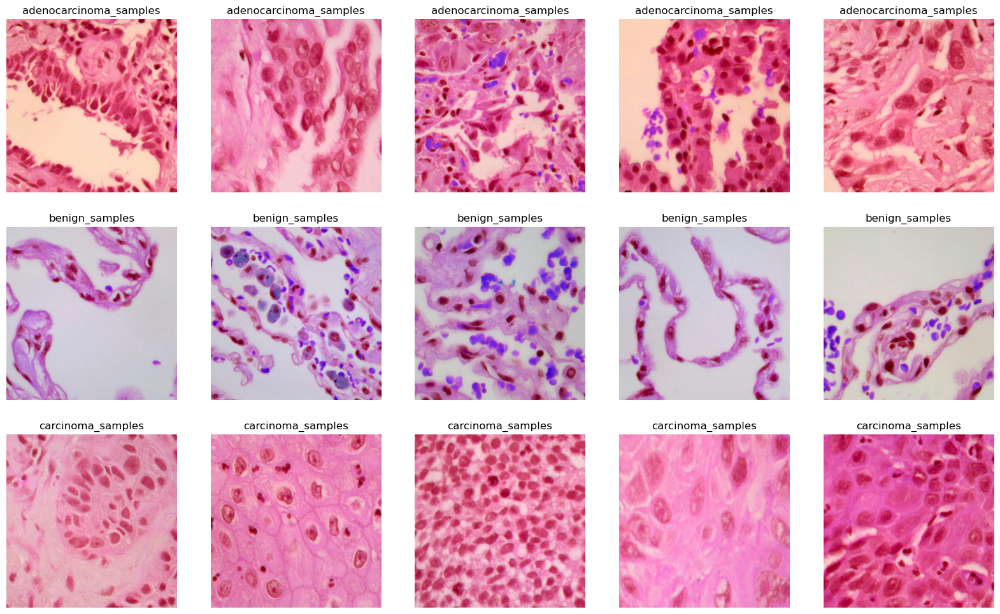

In [10]:
adenocarcinoma_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()
benign_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
carcinoma_samples = (train_data[train_data['label']==2]['image'].iloc[:5]).tolist()


samples = adenocarcinoma_samples + benign_samples+carcinoma_samples
del adenocarcinoma_samples, benign_samples,carcinoma_samples

f, ax = plt.subplots(3,5, figsize=(20,12))
for i in range(15):
    img = imread(samples[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("adenocarcinoma_samples")
    elif i<10:
        ax[i//5, i%5].set_title("benign_samples")
    elif i<15:
        ax[i//5, i%5].set_title("carcinoma_samples")
    
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

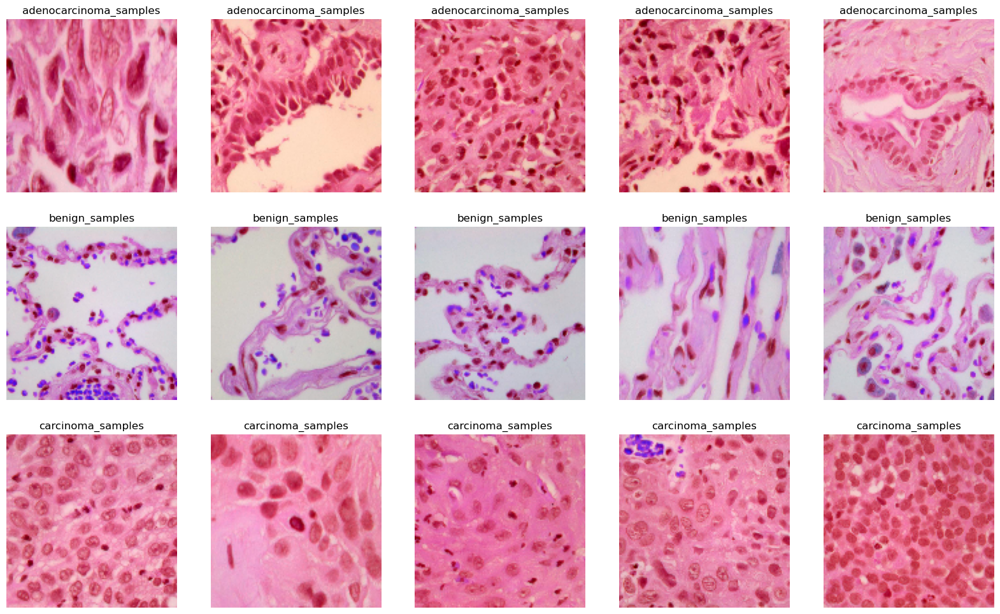

In [8]:
adenocarcinoma_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()
benign_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
carcinoma_samples = (train_data[train_data['label']==2]['image'].iloc[:5]).tolist()

samples = adenocarcinoma_samples + benign_samples+carcinoma_samples
del adenocarcinoma_samples, benign_samples,carcinoma_samples

# Plot the data 
f, ax = plt.subplots(3,5, figsize=(20,12))
for i in range(15):
    img = imread(samples[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (128,128))
    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("adenocarcinoma_samples")
    elif i<10:
        ax[i//5, i%5].set_title("benign_samples")
    elif i<15:
        ax[i//5, i%5].set_title("carcinoma_samples")
    
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

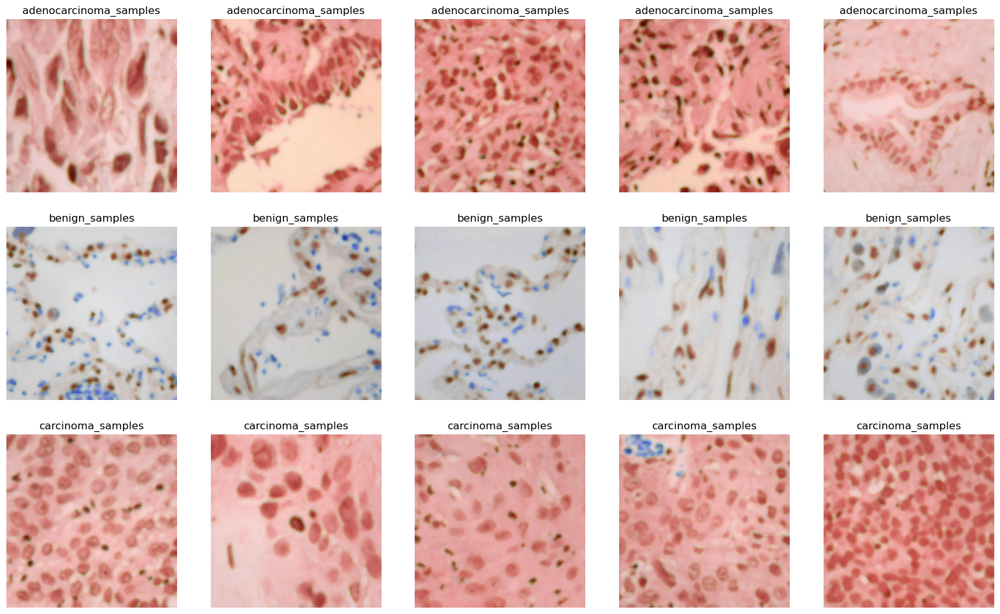

In [9]:
adenocarcinoma_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()
benign_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
carcinoma_samples = (train_data[train_data['label']==2]['image'].iloc[:5]).tolist()


samples = adenocarcinoma_samples + benign_samples+carcinoma_samples
del adenocarcinoma_samples, benign_samples,carcinoma_samples

f, ax = plt.subplots(3,5, figsize=(20,12))
for i in range(15):
    img = imread(samples[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (128,128))
    img = median_filter(img, size=3)
    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("adenocarcinoma_samples")
    elif i<10:
        ax[i//5, i%5].set_title("benign_samples")
    elif i<15:
        ax[i//5, i%5].set_title("carcinoma_samples")
    
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

In [10]:
def check_image_mode(image):
  if image.mode == 'L':
      print('The image is in grayscale mode')
  else:
      print('The image is in RGB mode')

In [11]:
image = pil_image.open(train_data[train_data['label']==0]['image'].iloc[0])
check_image_mode(image)
image = pil_image.open(train_data[train_data['label']==1]['image'].iloc[0])
check_image_mode(image)
image = pil_image.open(train_data[train_data['label']==2]['image'].iloc[0])
check_image_mode(image)

The image is in RGB mode
The image is in RGB mode
The image is in RGB mode


In [12]:
lung_aca_dir = data_dir /'lung_aca'
lung_n_dir = data_dir /'lung_n'
lung_scc_dir = data_dir /'lung_scc'

adenocarcinoma_lung = lung_aca_dir.glob('*.jpeg')
benign_lung = lung_n_dir.glob('*.jpeg')
carcinoma_lung = lung_scc_dir.glob('*.jpeg')

train_data = []
train_labels = []

for img in adenocarcinoma_lung:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (128,128))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = median_filter(img, size=3)
    img=np.array(img)
    img = img/255
    label = 'adenocarcinoma'
    train_data.append(img)
    train_labels.append(label)


for img in benign_lung:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (128,128))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = median_filter(img, size=3)
    img=np.array(img)
    img = img/255
    label ='Benign'
    train_data.append(img)
    train_labels.append(label)


for img in carcinoma_lung:
    img = cv2.imread(str(img))
    img = cv2.resize(img, (128,128))
    if img.shape[2] ==1:
        img = np.dstack([img, img, img])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = median_filter(img, size=3)
    img=np.array(img)
    img = img/255
    label = 'squamous cell carcinoma'
    train_data.append(img)
    train_labels.append(label)
    


train_data1 = np.array(train_data)
train_labels1 = np.array(train_labels)

print("Total number of validation examples: ", train_data1.shape)
print("Total number of labels:", train_labels1.shape)

Total number of validation examples:  (15000, 128, 128, 3)
Total number of labels: (15000,)


In [16]:
train_data1.shape

(15000, 128, 128, 3)

In [13]:
train_labels1 = pd.DataFrame(train_labels1, columns=[ 'label'],index=None)
train_labels1.head()

,label
0,adenocarcinoma
1,adenocarcinoma
2,adenocarcinoma
3,adenocarcinoma
4,adenocarcinoma


In [14]:
train_labels1['label'].unique()

array(['adenocarcinoma', 'Benign', 'squamous cell carcinoma'],
      dtype=object)

In [15]:
train_labels1['label']=train_labels1['label'].map({'adenocarcinoma':0,'Benign':1,'squamous cell carcinoma':2})

In [20]:
train_labels1.isnull().sum()

label    0
dtype: int64

In [16]:
train_data1 =train_data1.reshape(-1,128,128,3)

In [22]:
train_data1.shape

(15000, 128, 128, 3)

In [23]:
train_labels1.shape

(15000, 1)

In [17]:
X_train, X_test, y_train, y_test = train_test_split(train_data1, train_labels1, test_size=0.23, random_state=42)

In [25]:
y_train.shape

(11550, 1)

In [18]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(15, 7), text_size=10, norm=False, savefig=False): 
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] 
    n_classes = cm.shape[0]

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])
  
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes),
         yticks=np.arange(n_classes), 
         xticklabels=labels,
         yticklabels=labels)
  
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    plt.xticks(rotation=90, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    if savefig:
        fig.savefig("confusion_matrix.png")

In [27]:
input_shape = (128,128, 3)
model = Sequential([
    layers.Conv2D(64,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2))])
model.add(layers.Flatten())
model.add(layers.Dense(128,activation='relu'))
model.add(layers.Dense(3,activation='softmax'))
model.compile(optimizer='adam',loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 128)      0

In [28]:
history=model.fit(np.array(X_train), np.array(y_train), epochs=30, validation_data=(np.array(X_test), np.array(y_test)))

Epoch 1/30


/opt/conda/lib/python3.7/site-packages/keras/backend.py:5586: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits, "Softmax", "sparse_categorical_crossentropy"


361/361 [==============================] - 363s 1s/step - loss: 0.5170 - accuracy: 0.7345 - val_loss: 0.5390 - val_accuracy: 0.7530
Epoch 2/30
361/361 [==============================] - 354s 980ms/step - loss: 0.3960 - accuracy: 0.8339 - val_loss: 0.3445 - val_accuracy: 0.8525
Epoch 3/30
361/361 [==============================] - 351s 974ms/step - loss: 0.3172 - accuracy: 0.8674 - val_loss: 0.2811 - val_accuracy: 0.8945
Epoch 4/30
361/361 [==============================] - 351s 973ms/step - loss: 0.2708 - accuracy: 0.8922 - val_loss: 0.2498 - val_accuracy: 0.8936
Epoch 5/30
361/361 [==============================] - 350s 971ms/step - loss: 0.2297 - accuracy: 0.9106 - val_loss: 0.2525 - val_accuracy: 0.8925
Epoch 6/30
361/361 [==============================] - 349s 966ms/step - loss: 0.2049 - accuracy: 0.9193 - val_loss: 0.3217 - val_accuracy: 0.8687
Epoch 7/30
361/361 [==============================] - 346s 960ms/step - loss: 0.1291 - accuracy: 0.9481 - val_loss: 0.2241 - val_accuracy:

In [29]:
pred = model.predict(X_test)

108/108 [==============================] - 25s 230ms/step


In [30]:
pred = np.argmax(pred,axis=1)

In [31]:
pred

array([2, 1, 2, ..., 1, 0, 0])

In [32]:
labels={0:'adenocarcinoma',1:'Benign',2:'squamous cell carcinoma'}

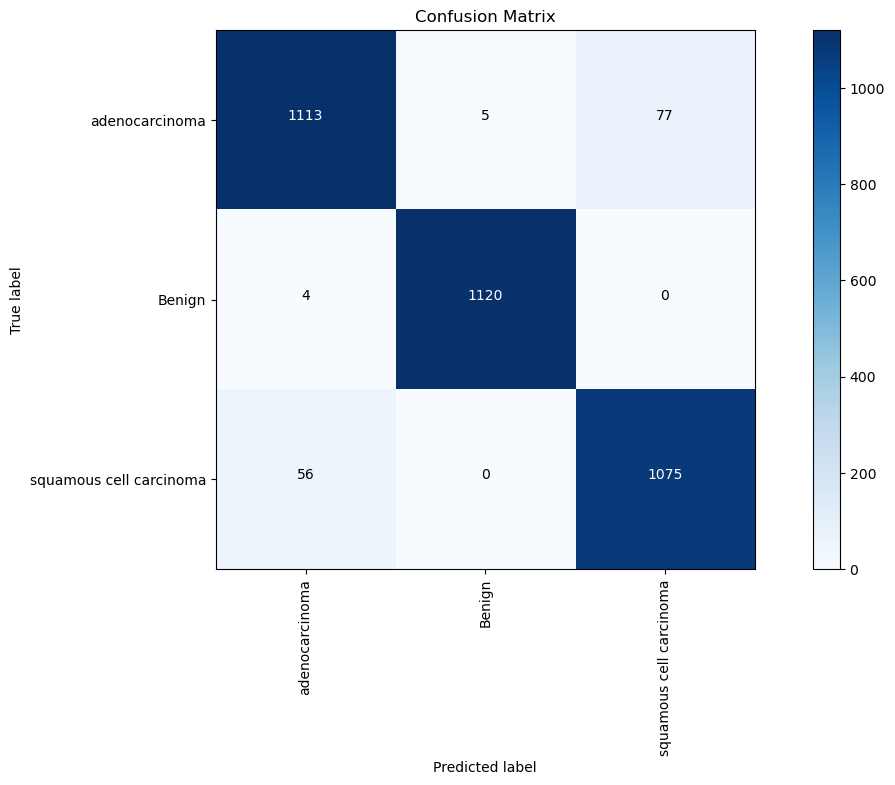

In [35]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [36]:
print("Model precision score on test is: ", round(precision_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model recall score on test is: ", round(recall_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model F1 score on test is: ", round(f1_score(y_test, pred, average='micro'),3))
print('-'*50)

Model precision score on test is:  0.959
--------------------------------------------------
Model recall score on test is:  0.959
--------------------------------------------------
Model F1 score on test is:  0.959
--------------------------------------------------


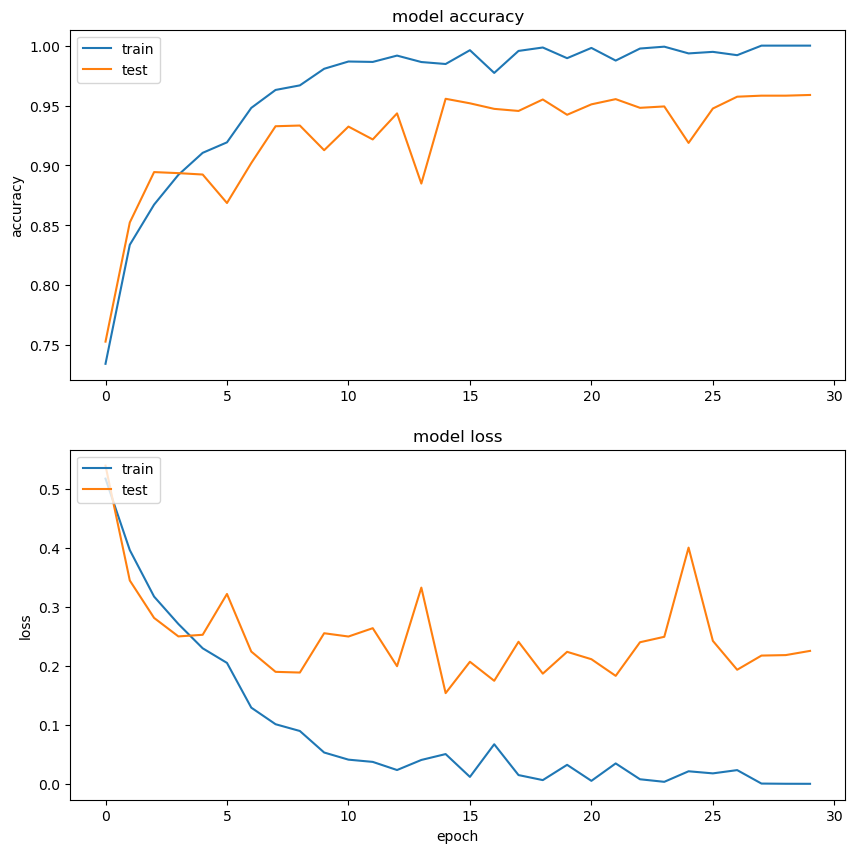

In [37]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [16]:
efficient_net = EfficientNetB0(
    weights='imagenet',
    input_shape=(128,128,3),
    include_top=False,
    pooling='max'
)

16705208/16705208 [==============================] - 0s 0us/step


In [17]:
model = Sequential()
model.add(efficient_net)
model.add(Dense(units = 128, activation='relu'))
model.add(Dropout(0.45))
model.add(Dense(units = 256, activation = 'relu'))
model.add(Dropout(0.45))
model.add(Dense(units = 4, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 dense (Dense)               (None, 128)               163968    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 4,247,591
Trainable params: 4,205,568
Non-

In [19]:
model.compile(optimizer=Adam(0.00001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [20]:
history = model.fit(np.array(X_train), np.array(y_train), epochs=50, validation_data=(np.array(X_test), np.array(y_test)))

Epoch 1/50
361/361 [==============================] - 631s 2s/step - loss: 2.1188 - accuracy: 0.4245 - val_loss: 1.3367 - val_accuracy: 0.3104
Epoch 2/50
361/361 [==============================] - 617s 2s/step - loss: 0.9850 - accuracy: 0.6208 - val_loss: 0.7535 - val_accuracy: 0.7032
Epoch 3/50
361/361 [==============================] - 618s 2s/step - loss: 0.6980 - accuracy: 0.7295 - val_loss: 0.3399 - val_accuracy: 0.8658
Epoch 4/50
361/361 [==============================] - 610s 2s/step - loss: 0.5603 - accuracy: 0.7824 - val_loss: 0.5422 - val_accuracy: 0.7704
Epoch 5/50
361/361 [==============================] - 600s 2s/step - loss: 0.4677 - accuracy: 0.8210 - val_loss: 0.3150 - val_accuracy: 0.8759
Epoch 6/50
361/361 [==============================] - 605s 2s/step - loss: 0.3998 - accuracy: 0.8551 - val_loss: 0.2746 - val_accuracy: 0.8948
Epoch 7/50
361/361 [==============================] - 610s 2s/step - loss: 0.3658 - accuracy: 0.8666 - val_loss: 0.2439 - val_accuracy: 0.9081

In [28]:
pred = model.predict(X_test)

108/108 [==============================] - 36s 332ms/step


In [29]:
pred = np.argmax(pred,axis=1)

In [30]:
pred

array([2, 1, 2, ..., 1, 0, 0])

In [31]:
labels={0:'adenocarcinoma',1:'Benign',2:'squamous cell carcinoma'}

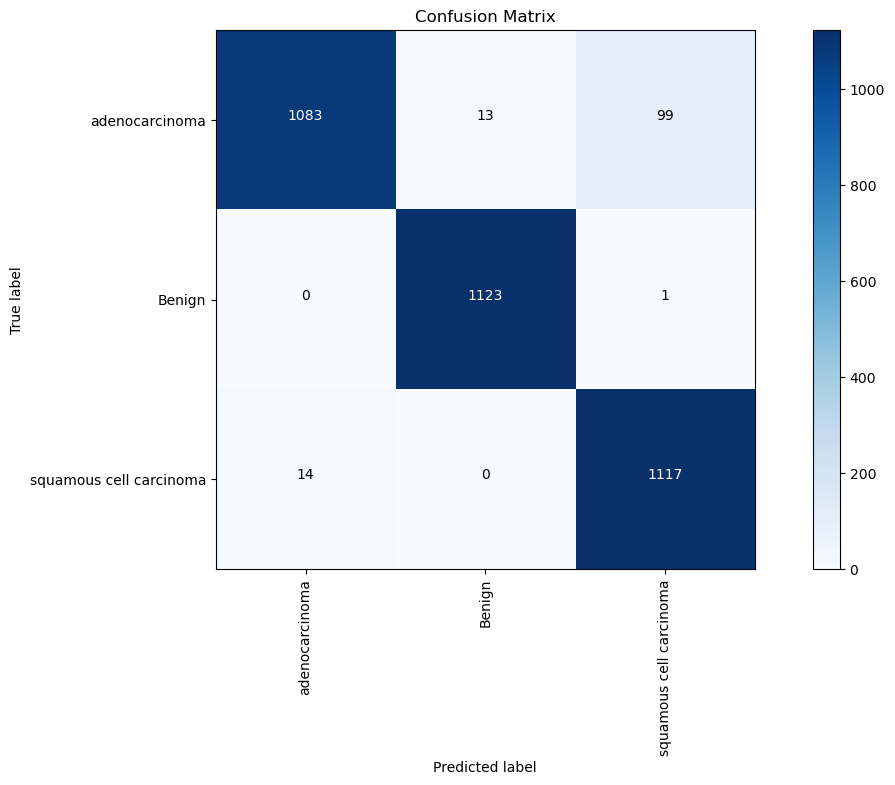

In [32]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [33]:
print("Model precision score on test is: ", round(precision_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model recall score on test is: ", round(recall_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model F1 score on test is: ", round(f1_score(y_test, pred, average='micro'),3))
print('-'*50)

Model precision score on test is:  0.963
--------------------------------------------------
Model recall score on test is:  0.963
--------------------------------------------------
Model F1 score on test is:  0.963
--------------------------------------------------


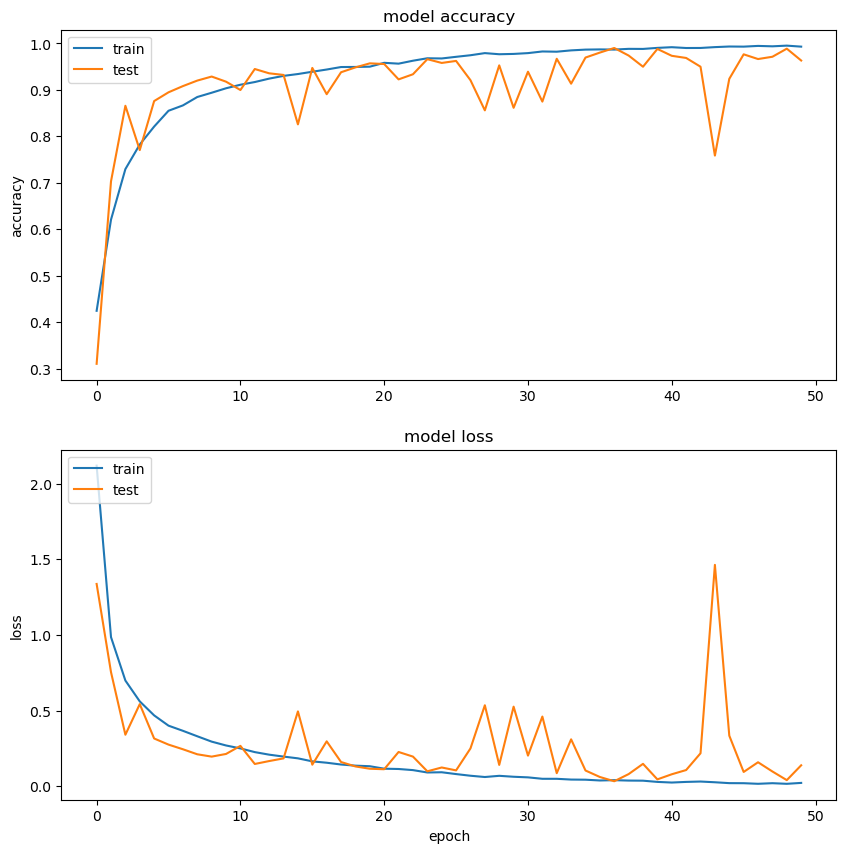

In [34]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [19]:
base_model_tf=ResNet50(include_top=False,weights='imagenet',input_shape=(128,128,3),classes=3)

94765736/94765736 [==============================] - 4s 0us/step


In [21]:
base_model_tf.trainable=False

pt=Input(shape=(128,128,3))
func=tf.cast(pt,tf.float32)
x=preprocess_input(func)
model_resnet=base_model_tf(x,training=False)
model_resnet=GlobalAveragePooling2D()(model_resnet)
model_resnet=Dense(128,activation='relu')(model_resnet)
model_resnet=Dense(64,activation='relu')(model_resnet)
model_resnet=Dense(3,activation='softmax')(model_resnet)

model_main=Model(inputs=pt,outputs=model_resnet)
model_main.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 tf.cast (TFOpLambda)        (None, 128, 128, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 128, 128, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 128, 128, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                      

In [22]:
model_main.compile(optimizer='Adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [23]:
history = model_main.fit(np.array(X_train), np.array(y_train), validation_data=(np.array(X_test), np.array(y_test)) ,epochs=20,verbose=1)

Epoch 1/20
361/361 [==============================] - 517s 1s/step - loss: 1.0650 - accuracy: 0.4233 - val_loss: 1.0468 - val_accuracy: 0.5696
Epoch 2/20
361/361 [==============================] - 475s 1s/step - loss: 0.9324 - accuracy: 0.5648 - val_loss: 0.8281 - val_accuracy: 0.6504
Epoch 3/20
361/361 [==============================] - 505s 1s/step - loss: 0.7880 - accuracy: 0.6539 - val_loss: 0.8047 - val_accuracy: 0.6394
Epoch 4/20
361/361 [==============================] - 474s 1s/step - loss: 0.7245 - accuracy: 0.6848 - val_loss: 0.6762 - val_accuracy: 0.7058
Epoch 5/20
361/361 [==============================] - 506s 1s/step - loss: 0.6719 - accuracy: 0.7055 - val_loss: 0.6242 - val_accuracy: 0.7368
Epoch 6/20
361/361 [==============================] - 509s 1s/step - loss: 0.6445 - accuracy: 0.7210 - val_loss: 0.7789 - val_accuracy: 0.6574
Epoch 7/20
361/361 [==============================] - 473s 1s/step - loss: 0.6389 - accuracy: 0.7159 - val_loss: 0.6433 - val_accuracy: 0.7200

In [25]:
pred = model_main.predict(X_test)

108/108 [==============================] - 101s 929ms/step


In [26]:
pred = np.argmax(pred,axis=1)

In [27]:
pred

array([2, 1, 2, ..., 1, 1, 0])

In [28]:
labels={0:'adenocarcinoma',1:'Benign',2:'squamous cell carcinoma'}

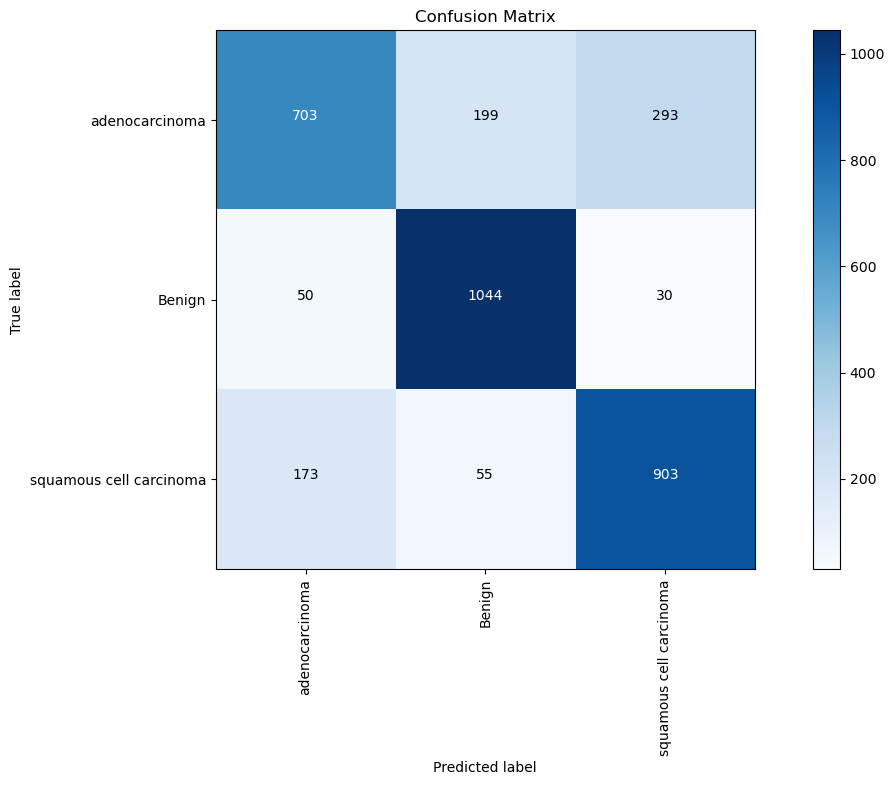

In [29]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [30]:
print("Model precision score on test is: ", round(precision_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model recall score on test is: ", round(recall_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model F1 score on test is: ", round(f1_score(y_test, pred, average='micro'),3))
print('-'*50)

Model precision score on test is:  0.768
--------------------------------------------------
Model recall score on test is:  0.768
--------------------------------------------------
Model F1 score on test is:  0.768
--------------------------------------------------


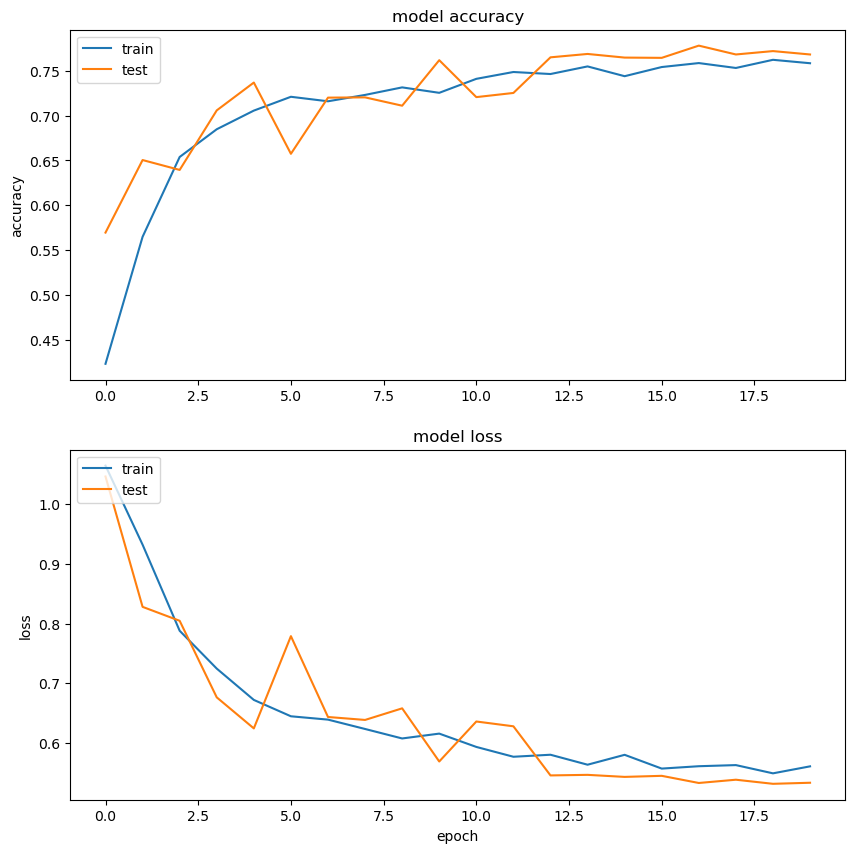

In [31]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [32]:
inceptionV3 = InceptionV3(
     weights='imagenet',
    include_top=False, 
    input_shape=(128,128,3)
)

87910968/87910968 [==============================] - 4s 0us/step


In [33]:
NUM_CLASSES = 3

inception_v3 = Sequential()
inception_v3.add(inceptionV3)
inception_v3.add(layers.Dropout(0.3))
inception_v3.add(layers.Flatten())
inception_v3.add(layers.Dropout(0.5))
inception_v3.add(layers.Dense(NUM_CLASSES, activation='softmax'))

inception_v3.layers[0].trainable = False

inception_v3.compile(loss='sparse_categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])

inception_v3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2, 2, 2048)        21802784  
                                                                 
 dropout (Dropout)           (None, 2, 2, 2048)        0         
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dropout_1 (Dropout)         (None, 8192)              0         
                                                                 
 dense_3 (Dense)             (None, 3)                 24579     
                                                                 
Total params: 21,827,363
Trainable params: 24,579
Non-trainable params: 21,802,784
_________________________________________________________________


In [34]:

history = inception_v3.fit(np.array(X_train), np.array(y_train), validation_data=(np.array(X_test), np.array(y_test)) ,epochs=30,validation_steps=30,)

Epoch 1/30
361/361 [==============================] - 251s 682ms/step - loss: 0.7989 - accuracy: 0.8022 - val_loss: 0.3692 - val_accuracy: 0.8867
Epoch 2/30
361/361 [==============================] - 243s 674ms/step - loss: 0.6763 - accuracy: 0.8475 - val_loss: 0.5008 - val_accuracy: 0.8957
Epoch 3/30
361/361 [==============================] - 243s 675ms/step - loss: 0.6491 - accuracy: 0.8673 - val_loss: 0.4195 - val_accuracy: 0.9009
Epoch 4/30
361/361 [==============================] - 243s 675ms/step - loss: 0.6567 - accuracy: 0.8689 - val_loss: 0.5432 - val_accuracy: 0.8893
Epoch 5/30
361/361 [==============================] - 243s 675ms/step - loss: 0.6698 - accuracy: 0.8745 - val_loss: 0.3872 - val_accuracy: 0.9122
Epoch 6/30
361/361 [==============================] - 243s 673ms/step - loss: 0.7368 - accuracy: 0.8753 - val_loss: 0.6145 - val_accuracy: 0.8817
Epoch 7/30
361/361 [==============================] - 243s 674ms/step - loss: 0.7410 - accuracy: 0.8777 - val_loss: 0.6092 -

In [35]:
pred = inception_v3.predict(X_test)

108/108 [==============================] - 48s 436ms/step


In [36]:
pred = np.argmax(pred,axis=1)

In [37]:
pred

array([2, 1, 0, ..., 1, 0, 2])

In [38]:
labels={0:'adenocarcinoma',1:'Benign',2:'squamous cell carcinoma'}

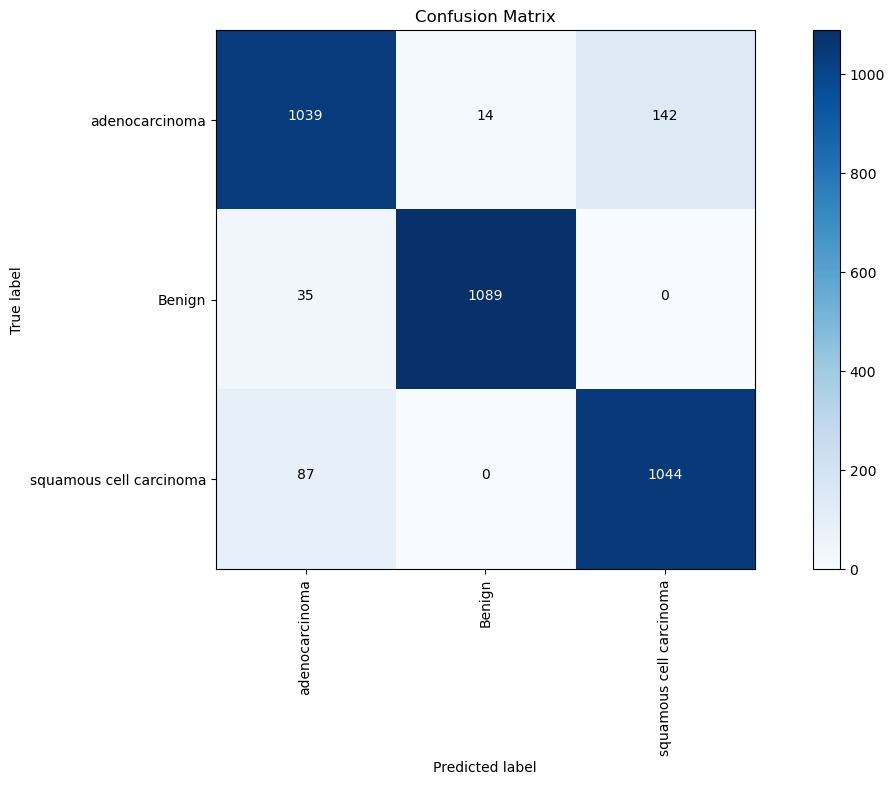

In [39]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [40]:

print("Model precision score on test is: ", round(precision_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model recall score on test is: ", round(recall_score(y_test, pred, average='micro'),3))
print('-'*50)
print("Model F1 score on test is: ", round(f1_score(y_test, pred, average='micro'),3))
print('-'*50)

Model precision score on test is:  0.919
--------------------------------------------------
Model recall score on test is:  0.919
--------------------------------------------------
Model F1 score on test is:  0.919
--------------------------------------------------


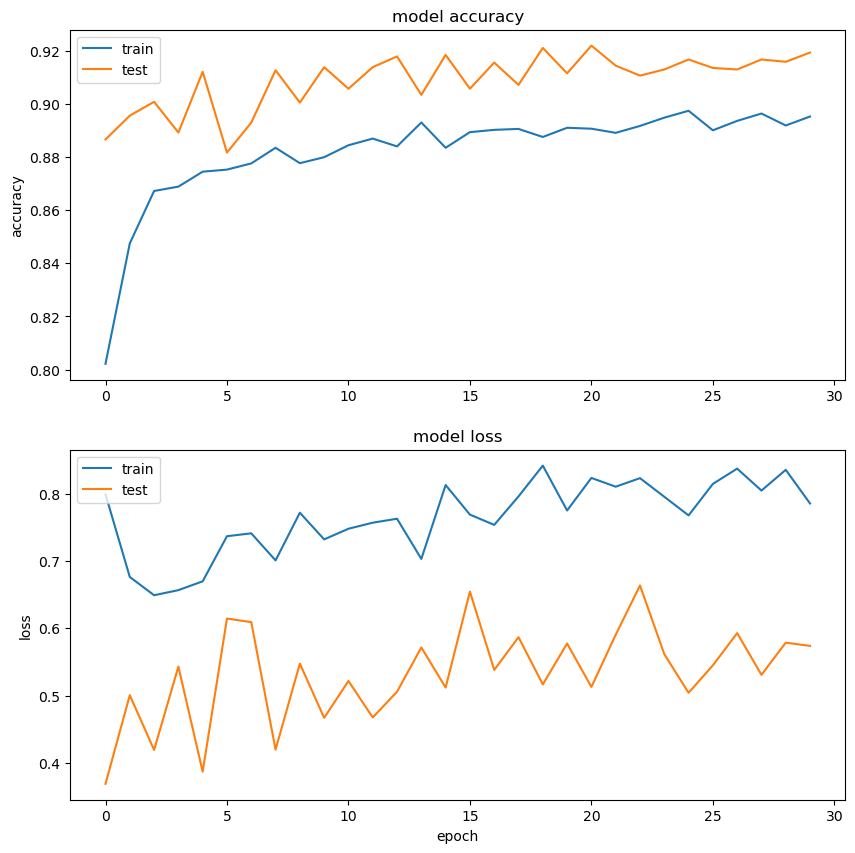

In [41]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()